## Exploratory Data Analysis

Cancerous cells have at least one tumour cells in the center 32x32 region.

In [3]:
import numpy as np
import pandas as pd
from collections import defaultdict
import matplotlib.pylab as plt
import seaborn as sns

from tifffile import imread

import tensorflow as tf
import tensorflow.keras as keras
from keras.models import Sequential
from keras.layers import Dense, Conv2D, MaxPool2D , Flatten, BatchNormalization, Activation, Dropout
from keras.preprocessing.image import ImageDataGenerator
from keras.optimizers import Adam

import os
#!pip install visualkeras
#import visualkeras
from skimage import draw

In [4]:
base_dir = '/kaggle/input/histopathologic-cancer-detection'
train_dir, test_dir = f'{base_dir}/train/', f'{base_dir}/test/'
ntrain, ntest = len(os.listdir(train_dir)), len(os.listdir(test_dir))
print(f'#training images = {ntrain}, #test inages={ntest}')

#training images = 220025, #test inages=57458


In [5]:
train_df = pd.read_csv(f'{base_dir}/train_labels.csv')
train_df['label'] = train_df['label'].astype(str)
train_df['id'] = train_df['id'] + '.tif'
train_df.head()

,id,label
0,f38a6374c348f90b587e046aac6079959adf3835.tif,0
1,c18f2d887b7ae4f6742ee445113fa1aef383ed77.tif,1
2,755db6279dae599ebb4d39a9123cce439965282d.tif,0
3,bc3f0c64fb968ff4a8bd33af6971ecae77c75e08.tif,0
4,068aba587a4950175d04c680d38943fd488d6a9d.tif,0


In [5]:
imread(f'{train_dir}/{train_df.id[0]}').shape

(96, 96, 3)

0    130908
1     89117
Name: label, dtype: int64

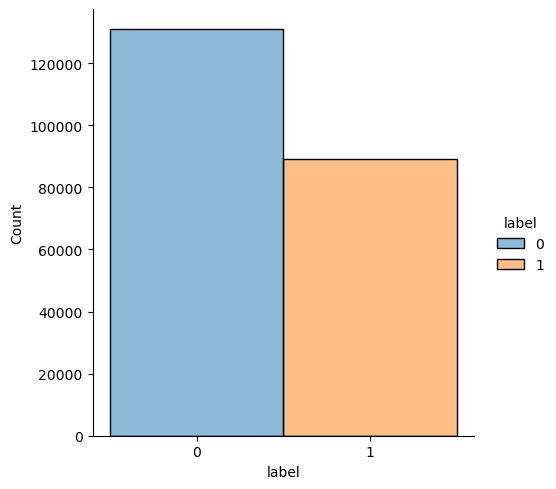

In [29]:
sns.displot(data=train_df, x='label', hue='label')
#train_df['label'] = train_df['label'].astype(int)
train_df['label'].value_counts()

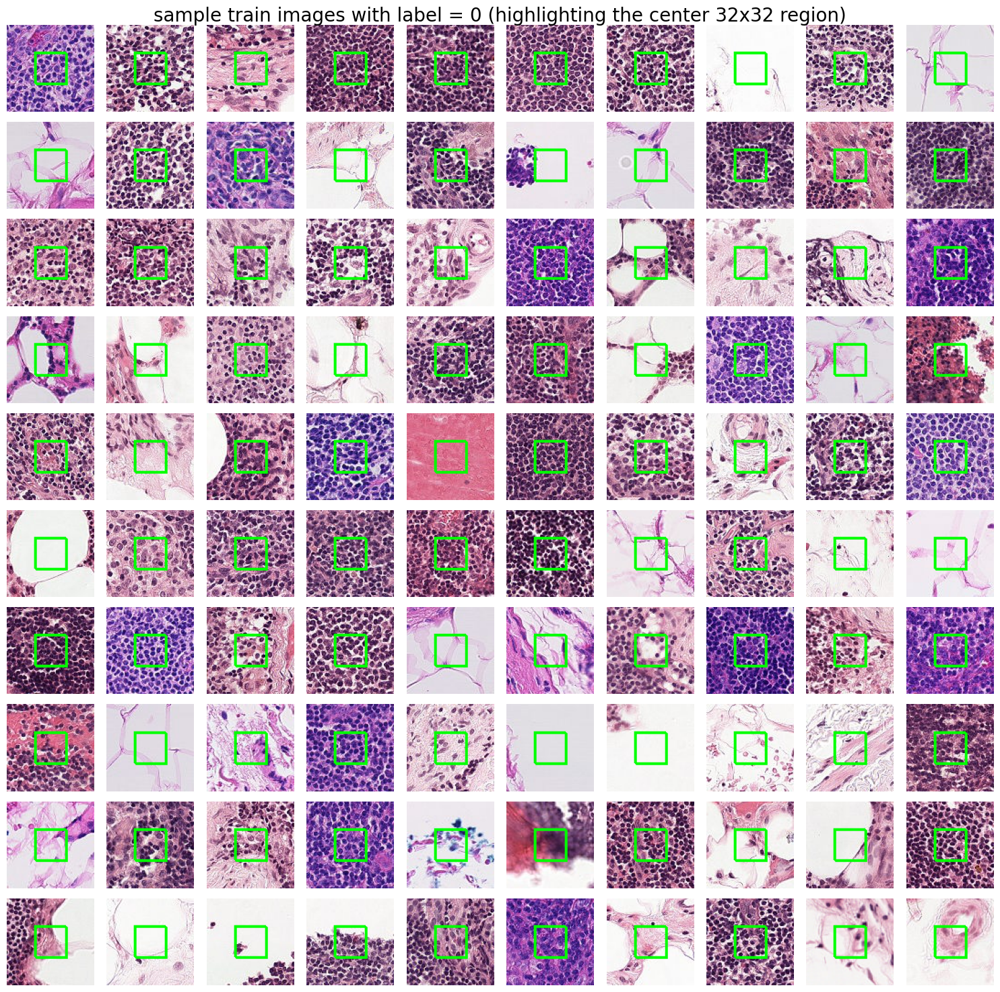

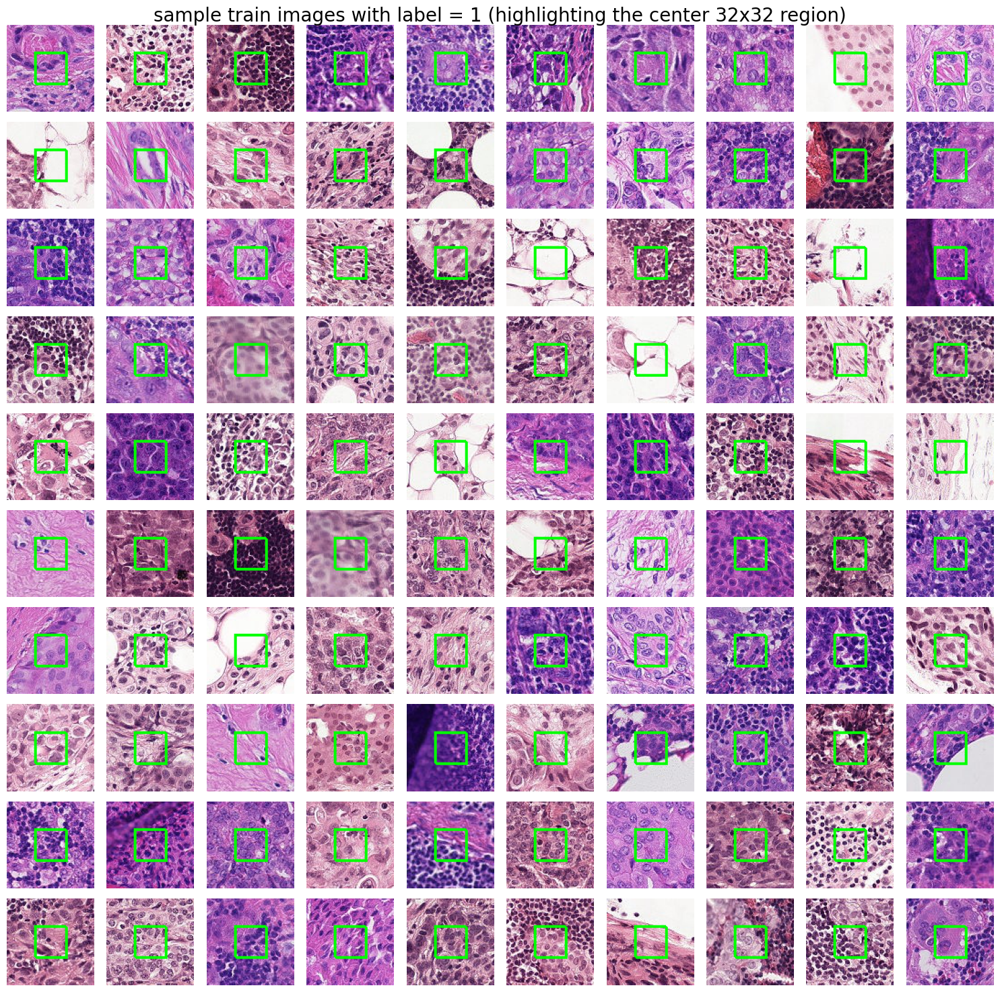

In [14]:
def plot_images(df, label, n=100):
  row, col = draw.rectangle_perimeter(start=(96//2-32//2,96//2-32//2), end=(96//2+32//2,96//2+32//2))
  df_sub = df.loc[df.label == label].sample(n)
  imfiles = df_sub['id'].values
  plt.figure(figsize=(15,15))
  for i in range(n):
    im = imread(f'{train_dir}/{imfiles[i]}')
    for j in range(-1,2):
        im[row+j, col+j, :] = [0, 255, 0]
    plt.subplot(10,10,i+1)
    plt.imshow(im)
    plt.axis('off')
  plt.suptitle(f'sample train images with label = {label} (highlighting the center 32x32 region)', size=20)
  plt.tight_layout()
  plt.show()

for label in train_df.label.unique():
  plot_images(train_df, label)

In [6]:
batch_size, im_size = 256, (96,96)

generator = ImageDataGenerator(rescale=1./255, validation_split=0.25)
train_data = generator.flow_from_dataframe(
    dataframe = train_df,
    x_col = 'id', # filenames
    y_col = 'label', # labels
    directory = train_dir,
    subset = 'training',
    class_mode = 'binary',
    batch_size = batch_size,
    target_size = im_size)

val_data = generator.flow_from_dataframe(
    dataframe = train_df,
    x_col = 'id', # filenames
    y_col = 'label', # labels
    directory = train_dir,
    subset = "validation",
    class_mode = 'binary',
    batch_size = batch_size,
    target_size = im_size)

Found 165019 validated image filenames belonging to 2 classes.
Found 55006 validated image filenames belonging to 2 classes.


## Baseline Models

In [7]:
class ConvBlock(tf.keras.layers.Layer):
    def __init__(self, n_filter, kernel_sz=(3,3), activation='relu', pool_sz=(2,2), batch_norm=False):
        super(ConvBlock, self).__init__()
        self.batch_norm = batch_norm
        self.conv_1 = Conv2D(n_filter, kernel_sz, activation=activation)
        self.bn_1 = BatchNormalization()
        self.conv_2 = Conv2D(n_filter, kernel_sz, activation=activation)
        self.bn_2 = BatchNormalization()
        self.pool = MaxPool2D(pool_size=pool_sz)

    def call(self, x):
        x = self.conv_1(x)
        if self.batch_norm:
          x = self.bn_1(x)
          x = tf.keras.layers.ReLU()(x)
        x = self.conv_2(x)
        if self.batch_norm:
          x = self.bn_2(x)
          x = tf.keras.layers.ReLU()(x)
        return self.pool(x)

class TopBlock(tf.keras.layers.Layer):
    def __init__(self, n_units=256, activation='relu', drop_out=False, drop_rate=0.5):
        super(TopBlock, self).__init__()
        self.drop_out = drop_out
        self.flat  = tf.keras.layers.Flatten()
        self.dropout = Dropout(drop_rate)
        self.dense = tf.keras.layers.Dense(n_units, activation=activation)
        self.classifier = tf.keras.layers.Dense(1, activation='sigmoid')

    def call(self, x, training=False):
        x = self.flat(x)
        #if training:
        #  x = self.dropout(x)
        x = self.dense(x)
        return self.classifier(x)

In [9]:
class CNNModel1(tf.keras.Model):
    def __init__(self, n_class=1):
        super(CNNModel1, self).__init__()
        self.conv_block_1 = ConvBlock(16)
        self.conv_block_2 = ConvBlock(32)
        # model top
        self.top_block = TopBlock(n_units=256)

    def call(self, inputs, training=False, **kwargs):
        # forward pass 
        x = self.conv_block_1(inputs)
        x = self.conv_block_2(x)
        return self.top_block(x)       

model1 = CNNModel1()
model1.build(input_shape=(batch_size,im_size[0],im_size[1],3))
model1.summary()

Model: "cnn_model1"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv_block (ConvBlock)      multiple                  2768      
                                                                 
 conv_block_1 (ConvBlock)    multiple                  13888     
                                                                 
 top_block (TopBlock)        multiple                  3613185   
                                                                 
Total params: 3,629,841
Trainable params: 3,629,841
Non-trainable params: 0
_________________________________________________________________


The above model can be defined using `keras` Sequential()` too and then it can be visualized as shown.

In [11]:
def get_color_map():
    color_map = defaultdict(dict)
    color_map[Conv2D]['fill'] = 'lightblue'
    color_map[Dropout]['fill'] = 'pink'
    color_map[keras.layers.MaxPooling2D]['fill'] = 'lightsalmon'
    color_map[Dense]['fill'] = 'lightgreen'
    color_map[Flatten]['fill'] = 'bisque'
    return color_map

In [1]:
#visualkeras.layered_view(model1, color_map=color_map)

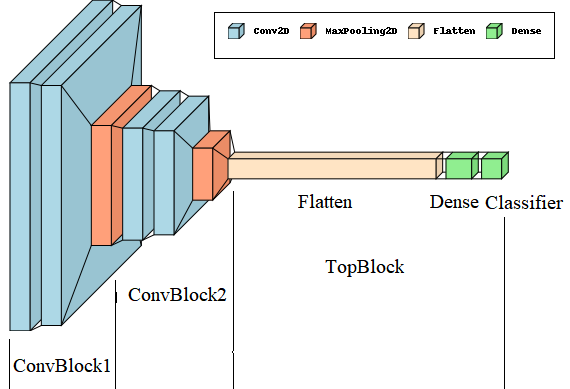

In [10]:
def plot_hist(hist):
    plt.figure(figsize=(10,5))
    plt.subplot(121)
    plt.plot(hist.history["accuracy"])
    plt.plot(hist.history['val_accuracy'])
    plt.legend(["Accuracy","Validation Accuracy"])
    plt.ylabel("Accuracy")
    plt.xlabel("Epoch")
    plt.grid()
    plt.subplot(122)
    plt.plot(hist.history['loss'])
    plt.plot(hist.history['val_loss'])
    plt.title("Model Evaluation")
    plt.ylabel("Loss")
    plt.xlabel("Epoch")
    plt.grid()
    plt.legend(["Loss","Validation Loss"])
    plt.tight_layout()
    plt.show()

Epoch 1/10
645/645 [==============================] - 1317s 2s/step - loss: 0.4684 - accuracy: 0.7830 - auc: 0.8523 - val_loss: 0.4359 - val_accuracy: 0.8032 - val_auc: 0.8757
Epoch 2/10
645/645 [==============================] - 522s 810ms/step - loss: 0.4220 - accuracy: 0.8105 - auc: 0.8818 - val_loss: 0.4118 - val_accuracy: 0.8141 - val_auc: 0.8910
Epoch 3/10
645/645 [==============================] - 349s 541ms/step - loss: 0.4021 - accuracy: 0.8203 - auc: 0.8931 - val_loss: 0.4032 - val_accuracy: 0.8205 - val_auc: 0.9002
Epoch 4/10
645/645 [==============================] - 315s 489ms/step - loss: 0.3817 - accuracy: 0.8319 - auc: 0.9043 - val_loss: 0.3765 - val_accuracy: 0.8355 - val_auc: 0.9106
Epoch 5/10
645/645 [==============================] - 317s 492ms/step - loss: 0.3665 - accuracy: 0.8399 - auc: 0.9122 - val_loss: 0.3680 - val_accuracy: 0.8377 - val_auc: 0.9166
Epoch 6/10
645/645 [==============================] - 321s 497ms/step - loss: 0.3570 - accuracy: 0.8448 - auc: 0

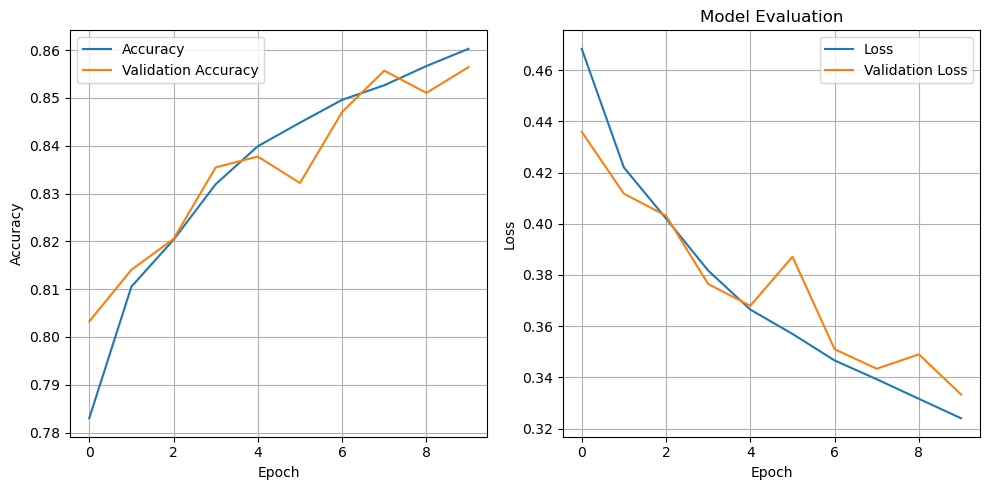

In [13]:
opt = Adam(learning_rate=0.0001)
model1.compile(optimizer=opt, loss='binary_crossentropy', metrics=['accuracy', tf.keras.metrics.AUC()])
hist = model1.fit(train_data, validation_data=val_data, epochs=10)
plot_hist(hist)

In [21]:
def create_submission_csv(test_dir, model):
    images_test = pd.DataFrame({'id':os.listdir(test_dir)})
    generator_test = ImageDataGenerator(rescale=1./255) # scale the test images to have pixel values in [0-1]

    test_data = generator_test.flow_from_dataframe(
        dataframe = images_test,
        x_col='id', # filenames
        directory=test_dir,
        class_mode=None,
        batch_size=1,
        target_size=im_size,
        shuffle=False)

    # predict with the model
    predictions = model.predict(test_data, verbose=1)
    # create submission dataframe for kaggle submission
    submission_df = pd.DataFrame()
    submission_df['id'] = images_test['id'].apply(lambda x: x.split('.')[0])
    submission_df['label'] = list(map(lambda x: 0 if x < 0.5 else 1, predictions.squeeze()))

    submission_df['label'].value_counts()
    submission_df.to_csv('submission.csv', index=False)
    return submission_df

In [ ]:
submission_df = create_submission_csv(test_dir, model1)

In [12]:
class CNNModel2(tf.keras.Model):
    def __init__(self, input_shape=(h,w,3), n_class=1):
        super(CNNModel2, self).__init__()
        # the first conv module
        self.conv_block_1 = ConvBlock(32, batch_norm=True)
        # the second conv module
        self.conv_block_2 = ConvBlock(32, batch_norm=True)
        # model top
        self.top_block = TopBlock(n_units=512)

    def call(self, inputs, training=False, **kwargs):
        # forward pass 
        x = self.conv_block_1(inputs)
        x = self.conv_block_2(x)
        return self.top_block(x)       

model2 = CNNModel2()
model2.build(input_shape=(batch_size,im_size[0],im_size[1],3))
model2.summary()

Model: "cnn_model2"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv_block (ConvBlock)      multiple                  10400     
                                                                 
 conv_block_1 (ConvBlock)    multiple                  18752     
                                                                 
 top_block (TopBlock)        multiple                  7226369   
                                                                 
Total params: 7,255,521
Trainable params: 7,255,265
Non-trainable params: 256
_________________________________________________________________


In [ ]:
opt = Adam(learning_rate=0.0001)
model2.compile(optimizer=opt, loss='binary_crossentropy', metrics=['accuracy', tf.keras.metrics.AUC()])
hist = model2.fit(train_data, validation_data=val_data, epochs=10)

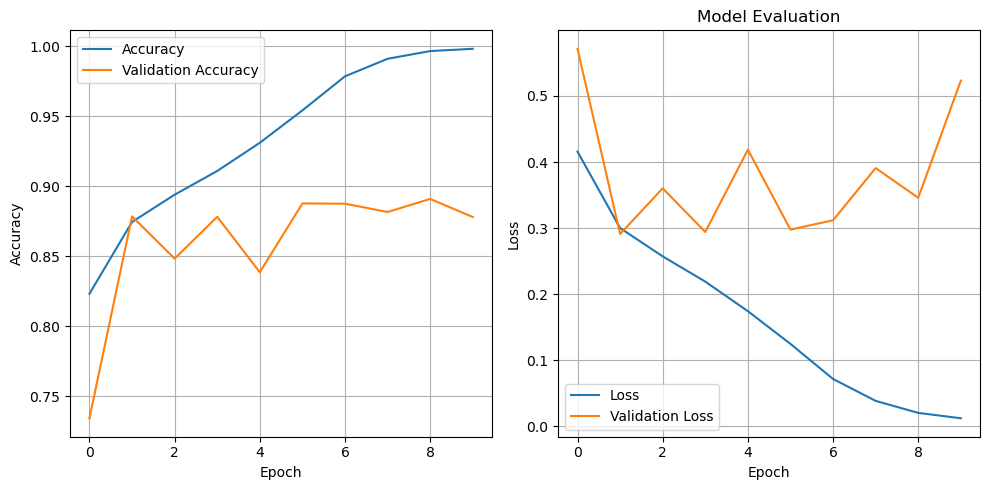

In [16]:
plot_hist(hist)

In [18]:
submission_df = create_submission_csv(test_dir, model2)
submission_df.head()

Found 57458 validated image filenames.
57458/57458 [==============================] - 588s 10ms/step


,id,label
0,a7ea26360815d8492433b14cd8318607bcf99d9e,0
1,59d21133c845dff1ebc7a0c7cf40c145ea9e9664,0
2,5fde41ce8c6048a5c2f38eca12d6528fa312cdbb,0
3,bd953a3b1db1f7041ee95ff482594c4f46c73ed0,0
4,523fc2efd7aba53e597ab0f69cc2cbded7a6ce62,0


## VGG16 Backbone

In [13]:
base_model = tf.keras.applications.VGG16(
    input_shape=(im_size[0],im_size[1],3), 
    include_top=False, 
    weights='imagenet'
)

#color_map = get_color_map()
#visualkeras.layered_view(base_model, color_map=color_map, legend=True)

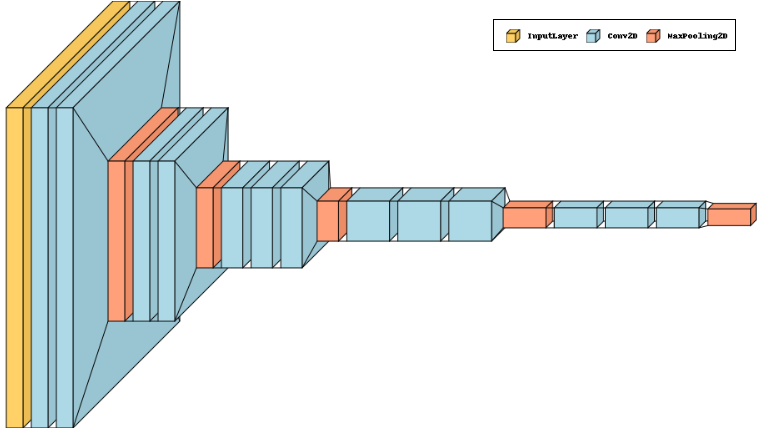

In [31]:
np.random.seed(1)
tf.random.set_seed(1)
model_vgg16 = Sequential([
    base_model,
    Flatten(),    
    BatchNormalization(),
    Dense(16, activation='relu'),
    Dropout(0.3),
    Dense(8, activation='relu'),
    Dropout(0.3),
    BatchNormalization(),
    Dense(1, activation='sigmoid')
], name='vgg16_backbone')
model_vgg16.summary()

Model: "vgg16_backbone"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 vgg16 (Functional)          (None, 3, 3, 512)         14714688  
                                                                 
 flatten_3 (Flatten)         (None, 4608)              0         
                                                                 
 batch_normalization_6 (Batc  (None, 4608)             18432     
 hNormalization)                                                 
                                                                 
 dense_9 (Dense)             (None, 16)                73744     
                                                                 
 dropout_6 (Dropout)         (None, 16)                0         
                                                                 
 dense_10 (Dense)            (None, 8)                 136       
                                                    

### Transfer Learning / Fine Tuning

In [32]:
opt = tf.keras.optimizers.Adam(0.001)
base_model.trainable = False
model_vgg16.compile(loss='binary_crossentropy', optimizer=opt, metrics=['accuracy', tf.keras.metrics.AUC()])

In [ ]:
%%time 
hist = model_vgg16.fit(train_data, epochs = 20, validation_data = val_data, verbose=1)

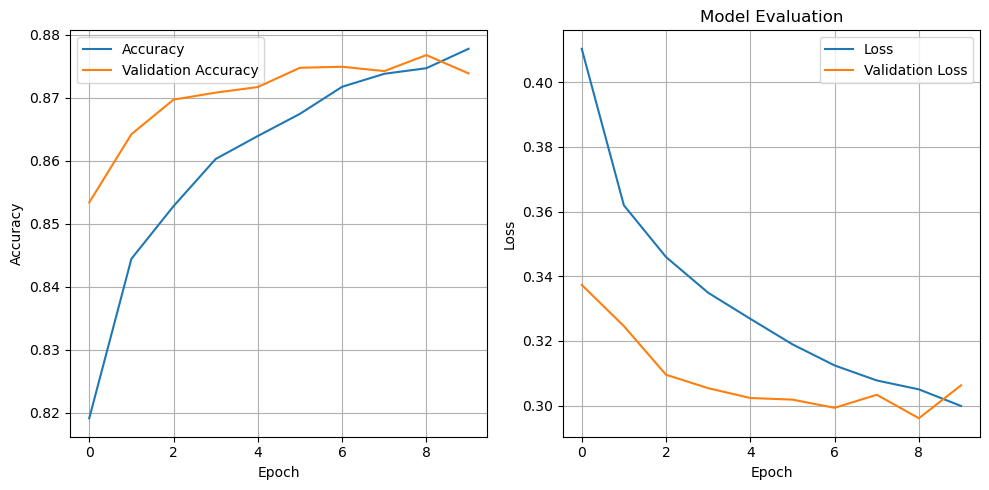

In [18]:
plot_hist(hist)

## Training from Scratch

In [34]:
base_model.trainable = True
model_vgg16.compile(loss='binary_crossentropy', optimizer=opt, metrics=['accuracy', tf.keras.metrics.AUC()])

In [35]:
%%time 
hist = model_vgg16.fit(train_data, epochs = 20, validation_data = val_data, verbose=1)

Epoch 1/20
645/645 [==============================] - 867s 1s/step - loss: 0.5446 - accuracy: 0.7338 - auc_6: 0.7940 - val_loss: 0.5420 - val_accuracy: 0.7202 - val_auc_6: 0.7990
Epoch 2/20
645/645 [==============================] - 524s 812ms/step - loss: 0.5008 - accuracy: 0.7689 - auc_6: 0.8329 - val_loss: 0.9227 - val_accuracy: 0.6275 - val_auc_6: 0.7825
Epoch 3/20
645/645 [==============================] - 543s 842ms/step - loss: 0.4721 - accuracy: 0.7896 - auc_6: 0.8551 - val_loss: 0.5896 - val_accuracy: 0.7274 - val_auc_6: 0.8574
Epoch 4/20
645/645 [==============================] - 544s 842ms/step - loss: 0.4151 - accuracy: 0.8228 - auc_6: 0.8908 - val_loss: 156.7007 - val_accuracy: 0.6567 - val_auc_6: 0.8239
Epoch 5/20
645/645 [==============================] - 534s 828ms/step - loss: 0.3698 - accuracy: 0.8484 - auc_6: 0.9156 - val_loss: 0.3955 - val_accuracy: 0.8148 - val_auc_6: 0.9197
Epoch 6/20
645/645 [==============================] - 517s 802ms/step - loss: 0.3137 - accu

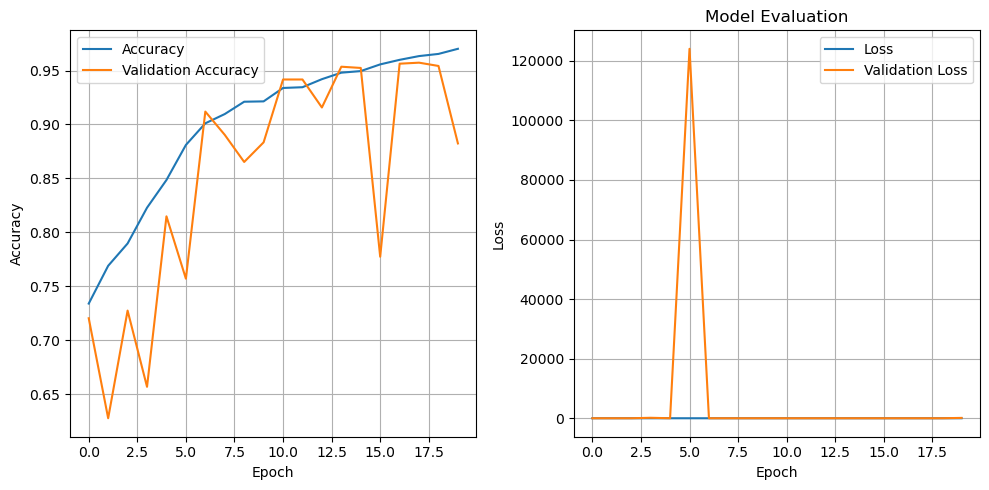

In [36]:
plot_hist(hist)

In [37]:
submission_df = create_submission_csv(test_dir, model_vgg16)
submission_df.head()

Found 57458 validated image filenames.
57458/57458 [==============================] - 372s 6ms/step


,id,label
0,a7ea26360815d8492433b14cd8318607bcf99d9e,1
1,59d21133c845dff1ebc7a0c7cf40c145ea9e9664,0
2,5fde41ce8c6048a5c2f38eca12d6528fa312cdbb,0
3,bd953a3b1db1f7041ee95ff482594c4f46c73ed0,1
4,523fc2efd7aba53e597ab0f69cc2cbded7a6ce62,1


## VGG19 Backbone

In [ ]:
base_model = tf.keras.applications.VGG19(
    input_shape=(im_size[0],im_size[1],3), 
    include_top=False, 
    weights='imagenet'
)
#color_map = get_color_map()
#visualkeras.layered_view(base_model, color_map=color_map, legend=True)

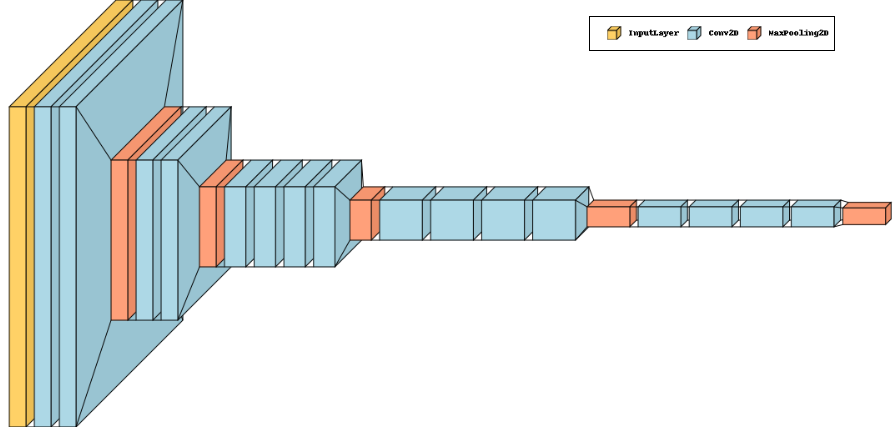

In [15]:
np.random.seed(1)
tf.random.set_seed(1)

model_vgg19 = Sequential([
    base_model,
    Flatten(),    
    BatchNormalization(),
    Dense(16, activation='relu'),
    Dropout(0.3),
    Dense(8, activation='relu'),
    Dropout(0.3),
    BatchNormalization(),
    Dense(1, activation='sigmoid')
], name='vgg19_backbone')

model_vgg19.summary()

Model: "vgg19_backbone"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 vgg19 (Functional)          (None, 3, 3, 512)         20024384  
                                                                 
 flatten_1 (Flatten)         (None, 4608)              0         
                                                                 
 batch_normalization_2 (Batc  (None, 4608)             18432     
 hNormalization)                                                 
                                                                 
 dense_3 (Dense)             (None, 16)                73744     
                                                                 
 dropout_2 (Dropout)         (None, 16)                0         
                                                                 
 dense_4 (Dense)             (None, 8)                 136       
                                                    

## Training from Scratch

In [16]:
opt = tf.keras.optimizers.Adam(0.001)
base_model.trainable = True
model_vgg19.compile(loss='binary_crossentropy', optimizer=opt, metrics=['accuracy', tf.keras.metrics.AUC()])

In [17]:
%%time 
hist = model_vgg19.fit(train_data, epochs = 20, validation_data = val_data, verbose=1)

Epoch 1/20
645/645 [==============================] - 1362s 2s/step - loss: 0.5519 - accuracy: 0.7240 - auc_1: 0.7850 - val_loss: 1294.4092 - val_accuracy: 0.7835 - val_auc_1: 0.8600
Epoch 2/20
645/645 [==============================] - 585s 907ms/step - loss: 0.4525 - accuracy: 0.7966 - auc_1: 0.8673 - val_loss: 1.1149 - val_accuracy: 0.6579 - val_auc_1: 0.7463
Epoch 3/20
645/645 [==============================] - 557s 863ms/step - loss: 0.3838 - accuracy: 0.8365 - auc_1: 0.9082 - val_loss: 1.0965 - val_accuracy: 0.7396 - val_auc_1: 0.7908
Epoch 4/20
645/645 [==============================] - 557s 864ms/step - loss: 0.3291 - accuracy: 0.8682 - auc_1: 0.9331 - val_loss: 0.5429 - val_accuracy: 0.7161 - val_auc_1: 0.9106
Epoch 5/20
645/645 [==============================] - 555s 859ms/step - loss: 0.2725 - accuracy: 0.8989 - auc_1: 0.9540 - val_loss: 0.2246 - val_accuracy: 0.9134 - val_auc_1: 0.9708
Epoch 6/20
645/645 [==============================] - 555s 860ms/step - loss: 0.2316 - ac

In [18]:
model_vgg19.save('model_vgg19_20.h5')

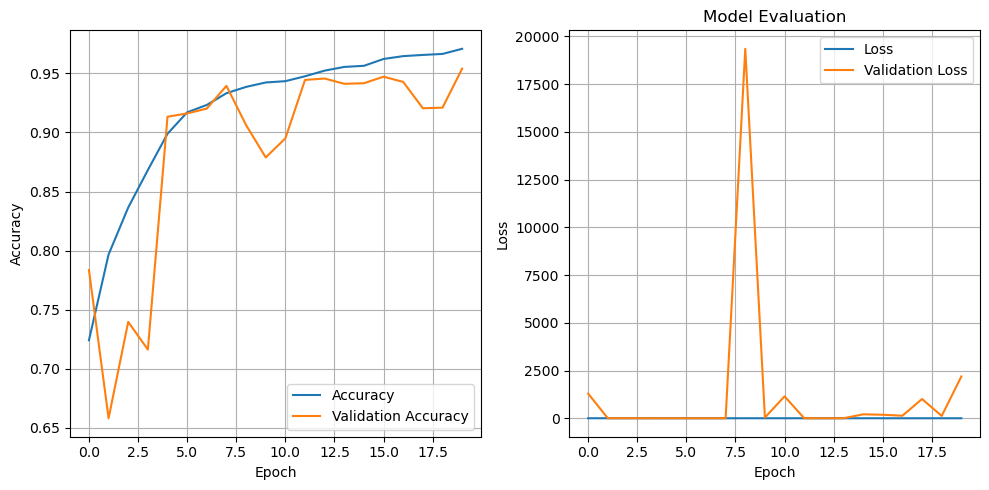

In [19]:
plot_hist(hist)

In [23]:
submission_df = create_submission_csv(test_dir, model_vgg19)
submission_df.head()

Found 57458 validated image filenames.
57458/57458 [==============================] - 425s 7ms/step


,id,label
0,a7ea26360815d8492433b14cd8318607bcf99d9e,1
1,59d21133c845dff1ebc7a0c7cf40c145ea9e9664,0
2,5fde41ce8c6048a5c2f38eca12d6528fa312cdbb,0
3,bd953a3b1db1f7041ee95ff482594c4f46c73ed0,0
4,523fc2efd7aba53e597ab0f69cc2cbded7a6ce62,1


## ResNet50 Backbone

In [14]:
base_model = tf.keras.applications.ResNet50(
    input_shape=(im_size[0],im_size[1],3), 
    include_top=False, 
    weights='imagenet'
)
#color_map = get_color_map()
#visualkeras.layered_view(base_model, color_map=color_map, legend=True)

94765736/94765736 [==============================] - 1s 0us/step


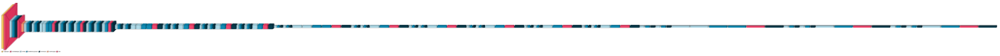

In [15]:
np.random.seed(1)
tf.random.set_seed(1)

model_resnet50 = Sequential([
    base_model,
    Flatten(),    
    BatchNormalization(),
    Dense(16, activation='relu'),
    Dropout(0.5),
    Dense(8, activation='relu'),
    Dropout(0.5),
    BatchNormalization(),
    Dense(1, activation='sigmoid')
], 'resnet50_backbone')

model_resnet50.summary()

Model: "resnet50_backbone"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 resnet50 (Functional)       (None, 3, 3, 2048)        23587712  
                                                                 
 flatten_1 (Flatten)         (None, 18432)             0         
                                                                 
 batch_normalization_4 (Batc  (None, 18432)            73728     
 hNormalization)                                                 
                                                                 
 dense_2 (Dense)             (None, 16)                294928    
                                                                 
 dropout_1 (Dropout)         (None, 16)                0         
                                                                 
 dense_3 (Dense)             (None, 8)                 136       
                                                 

## Training from Scratch

In [16]:
base_model.trainable = True
opt = tf.keras.optimizers.Adam(0.001)
model_resnet50.compile(loss='binary_crossentropy', optimizer=opt, metrics=['accuracy', tf.keras.metrics.AUC()])

In [17]:
%%time 
hist = model_resnet50.fit(train_data, validation_data=val_data, epochs=20, verbose=1)

Epoch 1/20
645/645 [==============================] - 1317s 2s/step - loss: 0.3414 - accuracy: 0.8588 - auc: 0.9298 - val_loss: 1.1011 - val_accuracy: 0.5951 - val_auc: 0.3934
Epoch 2/20
645/645 [==============================] - 593s 919ms/step - loss: 0.2412 - accuracy: 0.9122 - auc: 0.9653 - val_loss: 0.5169 - val_accuracy: 0.8323 - val_auc: 0.9167
Epoch 3/20
645/645 [==============================] - 450s 697ms/step - loss: 0.2124 - accuracy: 0.9235 - auc: 0.9722 - val_loss: 0.2642 - val_accuracy: 0.8980 - val_auc: 0.9597
Epoch 4/20
645/645 [==============================] - 448s 695ms/step - loss: 0.1941 - accuracy: 0.9305 - auc: 0.9766 - val_loss: 0.3500 - val_accuracy: 0.8499 - val_auc: 0.9337
Epoch 5/20
645/645 [==============================] - 446s 692ms/step - loss: 0.1791 - accuracy: 0.9353 - auc: 0.9795 - val_loss: 0.6030 - val_accuracy: 0.7776 - val_auc: 0.8575
Epoch 6/20
645/645 [==============================] - 449s 696ms/step - loss: 0.1673 - accuracy: 0.9416 - auc: 0

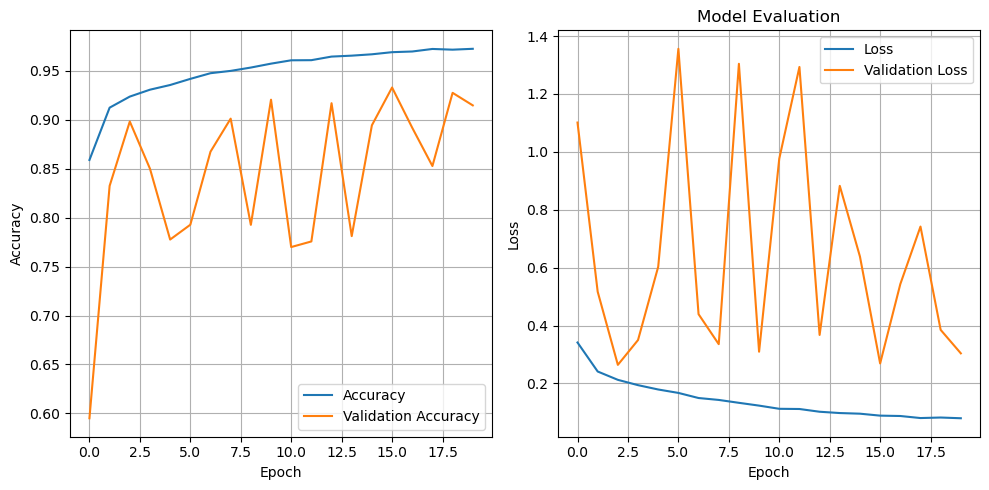

In [18]:
plot_hist(hist)

In [19]:
model_resnet50.save('model_resnet50_20.h5')

In [22]:
submission_df = create_submission_csv(test_dir, model_resnet50)
submission_df.head()

Found 57458 validated image filenames.
57458/57458 [==============================] - 640s 11ms/step


,id,label
0,a7ea26360815d8492433b14cd8318607bcf99d9e,0
1,59d21133c845dff1ebc7a0c7cf40c145ea9e9664,0
2,5fde41ce8c6048a5c2f38eca12d6528fa312cdbb,0
3,bd953a3b1db1f7041ee95ff482594c4f46c73ed0,0
4,523fc2efd7aba53e597ab0f69cc2cbded7a6ce62,1
